In [1]:
from google.colab import auth
auth.authenticate_user()

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os

os.chdir("/content/drive/My Drive/Colab Notebooks/KT_data_20200717")

In [3]:
!pip install plotly

## **Spending Patterns during Covid**

In [4]:
%matplotlib inline
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.renderers.default='notebook_connected'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

import csv
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

In [5]:
# korean setting
import platform
from matplotlib import font_manager, rc

plt.rcParams['axes.unicode_minus'] = False

if platform.system() == 'Darwin':
    rc('font', family='AppleGothic')
elif platform.system() == 'Windows':
    font_name = font_manager.FontProperties(fname='./MALGUN.TTF').get_name()
    rc('font', family=font_name)

In [6]:
#palette
pal = ['#50d890', '#007944','#888888','#f3c623','#EFEFEF', '#96bb7c', '#d9bf77','#3f3f44']

In [7]:
# data loading

card = pd.read_csv("./card_20200717.csv")
region = pd.read_csv("./adstrd_master.csv", encoding='utf-8')
fpopl = pd.read_csv("./fpopl.csv")
delivery = pd.read_csv("./delivery.csv")

In [8]:
card.head()

,receipt_dttm,adstrd_code,adstrd_nm,mrhst_induty_cl_code,mrhst_induty_cl_nm,selng_cascnt,salamt
0,20200104,1174066000,성내3동,7041,약국,463,5843230
1,20200104,1174066000,성내3동,7022,치과의원,33,7835550
2,20200104,1174066000,성내3동,7021,한의원,53,4589800
3,20200104,1174066000,성내3동,7020,의원,339,9267240
4,20200104,1174066000,성내3동,6110,자동차정비,19,4441000


In [9]:
card.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3713952 entries, 0 to 3713951
Data columns (total 7 columns):
 #   Column                Dtype 
---  ------                ----- 
 0   receipt_dttm          int64 
 1   adstrd_code           int64 
 2   adstrd_nm             object
 3   mrhst_induty_cl_code  int64 
 4   mrhst_induty_cl_nm    object
 5   selng_cascnt          int64 
 6   salamt                int64 
dtypes: int64(5), object(2)
memory usage: 198.3+ MB


In [10]:
card.describe()

,receipt_dttm,adstrd_code,mrhst_induty_cl_code,selng_cascnt,salamt
count,3.713952e+06,3.713952e+06,3.713952e+06,3.713952e+06,3.713952e+06
mean,2.020038e+07,1.144507e+09,6.066533e+03,2.130553e+02,8.661771e+06
std,1.467400e+02,1.918899e+07,2.382346e+03,9.099785e+03,5.059716e+08
min,2.020010e+07,1.111052e+09,1.001000e+03,-1.892000e+03,-2.937331e+09
25%,2.020023e+07,1.126069e+09,4.201000e+03,2.000000e+00,1.150000e+05
50%,2.020041e+07,1.147054e+09,7.020000e+03,9.000000e+00,4.720705e+05
75%,2.020051e+07,1.162063e+09,8.013000e+03,4.700000e+01,1.817860e+06
max,2.020061e+07,1.174070e+09,9.998000e+03,5.729589e+06,5.421737e+11


### Preprocessing

In [11]:
card.columns = ['날짜', '행정동 코드', '행정동', '업종 코드', '업종', '판매건수', '판매금액']
card['날짜'] = card['날짜'].astype('str').apply(lambda x:x[:4]+'-'+x[4:6]+'-'+x[6:])
card['행정동 코드'] = card['행정동 코드'].astype('str').apply(lambda x:x[:-2]).astype('int')

In [12]:
region.columns=['행정동 코드', '행정동', '광역시도', '시군구']
region['행정동 코드'] = region['행정동 코드'].astype('int')
card = pd.merge(card, region, on=['행정동 코드'], how='left')

card=card[card['광역시도']=='서울특별시'] # get only seoul
card=card.drop(['행정동 코드', '업종 코드'], axis=1)
card=card.groupby(['날짜', '업종']).sum().reset_index()

In [13]:
card.head()

,날짜,업종,판매건수,판매금액
0,2020-01-04,1급 호텔,38,6941145
1,2020-01-04,CATV홈쇼핑,4769,547207050
2,2020-01-04,가 방,83,5353600
3,2020-01-04,가전 제품,972,204308188
4,2020-01-04,가정용품수리,33,2047500


In [14]:
# if data is missing for such date, assume 0 for sales
date = list(card['날짜'].unique())
category = list(card['업종'].unique())
item = [date, category]

In [15]:
from itertools import product
card_temp = pd.DataFrame(product(*item), columns=['날짜', '업종'])

In [16]:
card = pd.merge(card, card_temp, on=['날짜', '업종'], how='right')
card = card.fillna(0)
card = card.groupby(['날짜','업종']).mean().reset_index()

In [17]:
card.head()

,날짜,업종,판매건수,판매금액
0,2020-01-04,1급 호텔,38.0,6941145.0
1,2020-01-04,2급 호텔,0.0,0.0
2,2020-01-04,CATV,0.0,0.0
3,2020-01-04,CATV홈쇼핑,4769.0,547207050.0
4,2020-01-04,L P G,0.0,0.0


In [18]:
# get weekly mean
card_compare = card.copy()
import datetime as dt

card['주']=pd.to_datetime(card['날짜']).dt.week # add week
card = card.groupby(['업종', '주']).mean().reset_index()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



In [19]:
card.head()

,업종,주,판매건수,판매금액
0,1급 호텔,1,19.000000,3.470572e+06
1,1급 호텔,2,23.000000,3.767738e+06
2,1급 호텔,3,28.000000,3.316541e+06
3,1급 호텔,4,358.428571,7.270609e+07
4,1급 호텔,5,517.428571,8.460931e+07


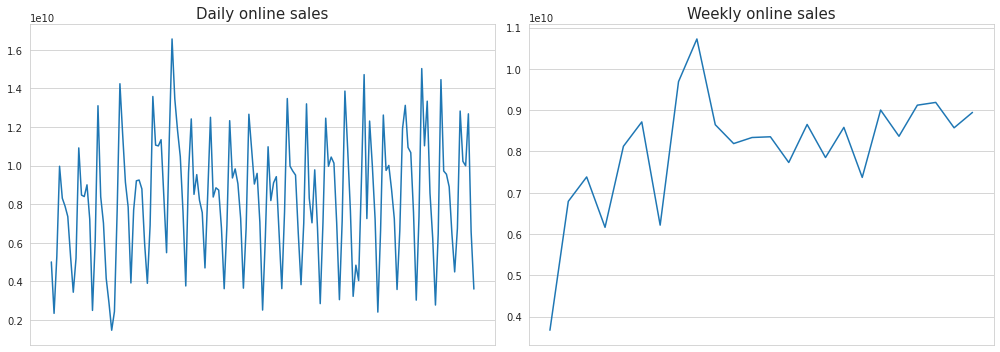

In [20]:
fig, ax = plt.subplots(1,2,figsize=(14,5))

ax[0].plot(card_compare[card_compare['업종'] == '인터넷종합Mall']['판매금액'])
ax[0].set_title("Daily online sales", fontsize=15)
ax[0].set_xticks([])
ax[1].plot(card[card['업종'] == '인터넷종합Mall']['판매금액'])
ax[1].set_title("Weekly online sales", fontsize=15)   
ax[1].set_xticks([])
plt.tight_layout()

In [21]:
corr = pd.pivot(card, index='주', columns='업종', values='판매건수').corr()

In [22]:
corr.isnull()

업종,1급 호텔,2급 호텔,CATV,CATV홈쇼핑,L P G,P2P송금,PG 상품권,가 방,가전 제품,가정용품수리,갈비전문점,건강식품(회원제형태),건강진단,건축요업품,견인서비스,고속 버스,골동품 점,골프 용품,골프경기장,골프연습장,공공 요금,공공요금/대상,공무원연금매점,과학기자재,관광여행,교육테이프,구내매점(국가기관등),국산 신차,국산신차직영부품/정비업소,귀 금 속,기계 공구,기념품 점,기능학원,기타 교육,기타 운송,기타가구,기타건강식,기타건축자재,기타광학품,기타교통수단,...,카인테리어,카지노,칵테일바,캐쥬얼의류,컴 퓨 터,컴퓨터학원,콘 도,택 시,택시회사,테니스 장,통신 기기,통신기기무이자할부,통신서비스,통신서비스/비대상,통신판매(생활서비스),통신판매(일반),통신판매1,통신판매2,특급 호텔,티켓,페 인 트,편 의 점,피부미용실,피아노대리점,학습지교육,학원(회원제형태),한방병원,한약방,한의원,한정식,항 공 사,헬스 크럽,혼례서비스,혼수전문점,홍삼 제품,화 랑,화 원,화 장 품,화물 운송,화방표구점
업종,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1급 호텔,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2급 호텔,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
CATV,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
CATV홈쇼핑,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
L P G,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
화 랑,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
화 원,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fal

In [23]:
temp = corr.isnull().sum()

In [24]:
temp[temp > 2]

업종
비씨카드정산용(할인)    260
카지노            260
dtype: int64

In [25]:
## delete first three weeks data, as data is missing and hence low values occur

card_temp = card.copy()
card_temp['판매건수'] = card.groupby('업종')['판매건수'].transform(lambda x: (x-x.min())/(x.max() - x.min()))

front_week = card_temp[(card_temp['주'].isin([1,2,3]))]
behind_week = card_temp[~(card_temp['주'].isin([1,2,3]))]
k1=front_week.groupby(['업종']).mean()['판매건수'].median(); k2=behind_week.groupby(['업종']).mean()['판매건수'].median()

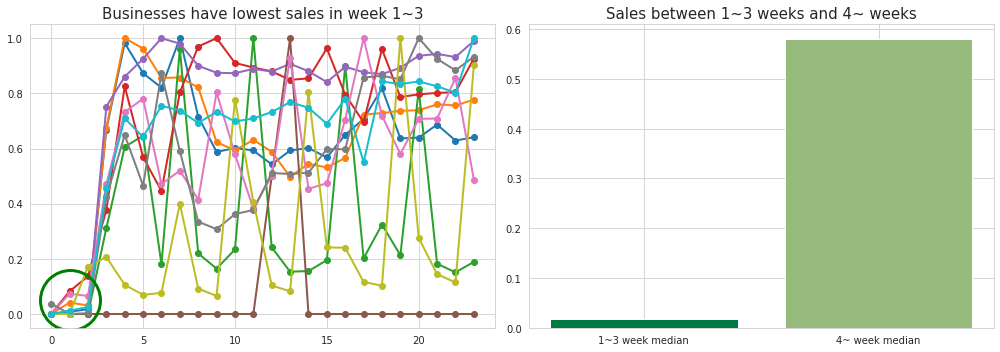

In [27]:
fig, ax = plt.subplots(1,2,figsize=(14,5))
kind = list(card['업종'].unique())
 
for i in range(0, len(set(card_temp['업종']))):
    if i//10 == 0:
        ax[0].plot(np.array(card_temp[card_temp['업종'] == kind[i]]['판매건수']),marker='o', linewidth=2)
ax[0].set_title('Businesses have lowest sales in week 1~3', fontsize=15)
ax[0].plot(1, 0.05, 'o', ms=60, mfc='none', color='g', mew=3)
        
x=['1~3 week median', '4~ week median']
y=[k1,k2]
ax[1].bar(x, y,  color=[pal[1],pal[5]])
ax[1].set_title("Sales between 1~3 weeks and 4~ weeks", fontsize=15)

plt.tight_layout()

In [28]:
card = card[~card['주'].isin([1,2,3])].reset_index(drop=True)

In [29]:
# delete data where corr = 0, due to null values
card = card[~card['업종'].isin(list(temp[temp>2].index))].reset_index(drop=True)

In [30]:
# make cluster and minmax scaling function
import scipy.cluster.hierarchy as spc
def hierarchical_clustering(correlation, method, param): # Agglomerative clustering
  pdist = spc.distance.pdist(correlation) # start cluster based on distance of correlations
  linkage = spc.linkage(pdist, method=method) # create cluster result in matrix
  idx = spc.fcluster(linkage, param*pdist.max(), 'distance') # set cluster with follower threshold, and return cluster indexes
  cluster = pd.DataFrame({'업종':correlation.index, '그룹':idx})
  return cluster

def get_scale(Data, target1, target2):
  Data[target1+"_sc"]=np.zeros(Data.shape[0])
  Data[target2+"_sc"]=np.zeros(Data.shape[0])

  for kind in Data['업종'].unique():
    temp=Data[Data['업종'] == kind].copy()
    temp[target1+"_sc"] = temp[target1].transform(lambda x:(x-x.min())/(x.max() - x.min()))
    temp[target2+"_sc"] = temp[target2].transform(lambda x:(x-x.min())/(x.max() - x.min()))
    index = temp.index
    Data.loc[index, target1+"_sc"] = temp[target1+"_sc"]
    Data.loc[index, target2+"_sc"] = temp[target2+"_sc"]

  return Data

In [31]:
corr = pd.pivot(card, index='주', columns='업종', values='판매건수').corr()
cluster = hierarchical_clustering(corr, 'complete', 0.45)

In [32]:
cluster

,업종,그룹
0,1급 호텔,6
1,2급 호텔,6
2,CATV,11
3,CATV홈쇼핑,4
4,L P G,2
...,...,...
253,화 랑,1
254,화 원,12
255,화 장 품,6
256,화물 운송,4


In [33]:
card = get_scale(card, '판매금액', '판매건수')

In [34]:
cluster['그룹'].unique()

array([ 6, 11,  4,  2, 10, 12,  5,  1,  8,  3,  9,  7], dtype=int32)

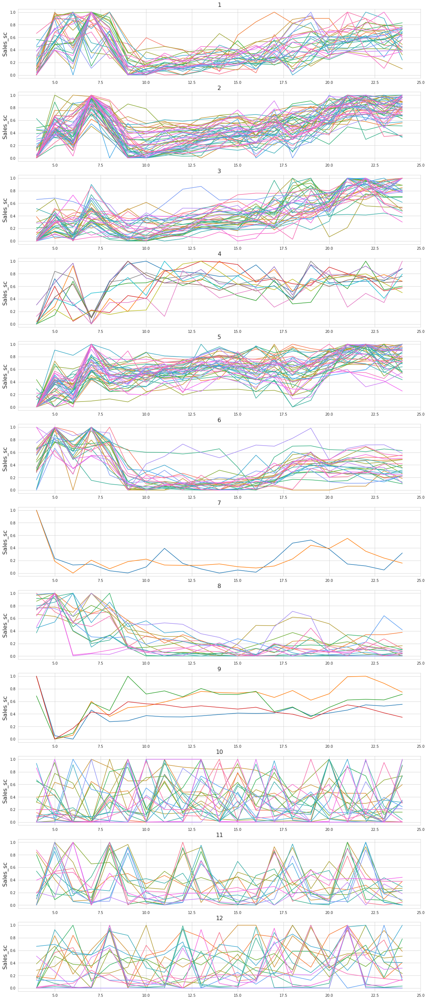

In [35]:
fig, ax = plt.subplots(12, 1, figsize=(20, 50))
for num, i in enumerate(list(range(1, 13))):
  cluster_kind = list(cluster[cluster['그룹']==i]['업종'])
  temp = card[card['업종'].isin(cluster_kind)]
  sns.lineplot(x= temp['주'], y=temp['판매건수_sc'], hue=temp['업종'], ax=ax[num])
  ax[num].legend().set_visible(False); ax[num].set_xlabel("")
  ax[num].set_title(i, fontsize=16)
  ax[num].set_ylabel('Sales_sc', fontsize=16)

In [36]:
# drop businesses with no clear trend
remove = []

for i in [11, 10, 12]:
  remove += list(cluster[cluster.그룹==i]['업종'])

  # keep the following
remove.remove('콘   도')
remove.remove('택   시')
remove.remove('대형할인점')

In [37]:
cluster[cluster['그룹'].isin([11, 10, 12])].sort_values(by='그룹')

,업종,그룹
161,이동통신요금,10
188,정보서비스,10
106,사업자미등록개인,10
101,비영리/비대상,10
184,전자상거래 상품권 전문판매,10
213,총포류판매,10
75,대학등록금,10
179,장례서비스,10
183,전자상거래 상품권,10
58,기타전문점,10


In [38]:
# add moving average
card['이동평균_건수'] = card.groupby('업종').rolling(window=3, min_periods=1).mean().reset_index()['판매건수']
card['이동평균_금액'] = card.groupby('업종').rolling(window=3, min_periods=1).mean().reset_index()['판매금액']
card=get_scale(card, '이동평균_건수', '이동평균_금액')


In [39]:
card_new = card[~card['업종'].isin(remove)].reset_index(drop=True).copy()

In [40]:
# remove clusters with few elements
corr_ma = pd.pivot(card_new[['업종', '주', '이동평균_건수']], index='주', columns='업종', values='이동평균_건수').corr()
cluster_ma = hierarchical_clustering(corr_ma, 'complete', 0.3)

In [41]:
cluster_ma['그룹'].value_counts()

9     37
11    34
12    25
2     23
8     19
10    17
15    11
14    10
5     10
6      8
7      6
3      3
13     2
1      2
16     1
4      1
Name: 그룹, dtype: int64

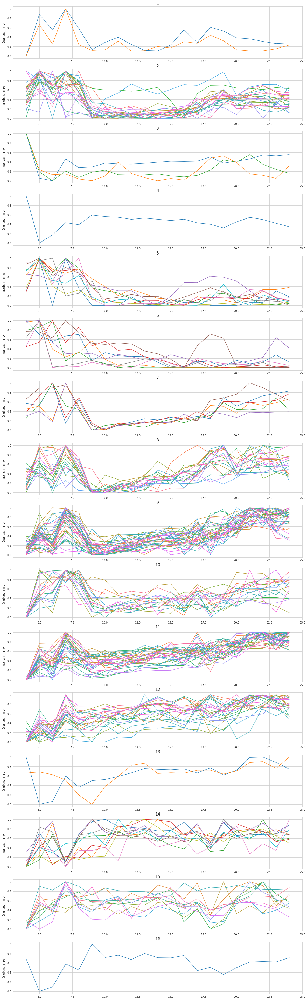

In [42]:
fig, ax = plt.subplots(16, 1, figsize=(20, 70))
for num, i in enumerate(list(range(1, 17))):
  cluster_kind = list(cluster_ma[cluster_ma['그룹']==i]['업종'])
  temp = card[card['업종'].isin(cluster_kind)]
  sns.lineplot(x= temp['주'], y=temp['판매건수_sc'], hue=temp['업종'], ax=ax[num])
  ax[num].legend().set_visible(False); ax[num].set_xlabel("")
  ax[num].set_title(i, fontsize=16)
  ax[num].set_ylabel('Sales_mv', fontsize=16)

In [43]:
cluster_count = cluster_ma['그룹'].value_counts()
ind = cluster_count[cluster_count.values<=4].index 

In [44]:
remove = ['법률회계서비스(개인)','법률회계서비스(법인)','일반 서적', '기타농업관련', '제과점', '미곡상', '세 차 장'] 

for i in ind:
    remove += list(cluster_ma[cluster_ma.그룹==i]['업종'])

In [45]:
card_new = card_new[~card_new['업종'].isin(remove)].reset_index(drop=True)

### Clustering

In [46]:
temp_ma = pd.pivot(card_new[['업종','주','이동평균_건수_sc']], index='주', columns='업종', values='이동평균_건수_sc').corr()

In [47]:
from scipy.cluster.hierarchy import dendrogram, linkage

corr_ma2 = pd.pivot(card_new[['업종', '주', '이동평균_건수']], index='주', columns='업종', values='이동평균_건수').corr()
pdist = spc.distance.pdist(corr_ma2)
linked = linkage(pdist, 'ward')

fig = ff.create_dendrogram(linked, color_threshold=125)
fig.update_layout(width=800, height=500)
fig.show()

In [48]:
corr_ma = pd.pivot(card_new[['업종','주','이동평균_건수']], index='주', columns='업종', values='이동평균_건수').corr()

param_list = [0.1, 0.2, 0.3, 0.4, 0.5,0.51,0.55,0.59,0.6, 0.7, 0.8, 0.9]
n_cluster = []
for i in param_list:
    pdist = spc.distance.pdist(corr_ma)
    linkage = spc.linkage(pdist, method='ward')
    idx = spc.fcluster(linkage, i * pdist.max(), 'distance')
    n_cluster.append(len(set(idx)))

In [49]:
corr_ma = pd.pivot(card_new[['업종','주','이동평균_건수']], index='주', columns='업종', values='이동평균_건수').corr()
cluster_ma = hierarchical_clustering(corr_ma, 'ward', param_list[np.where(np.array(n_cluster) == 9)[0][0]])  

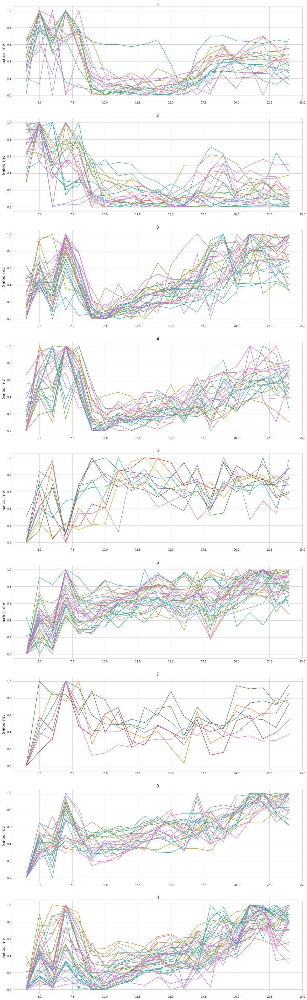

In [50]:
fig, ax = plt.subplots(9, 1, figsize=(20, 70))
for num, i in enumerate(list(range(1, 10))):
  cluster_kind = list(cluster_ma[cluster_ma['그룹']==i]['업종'])
  temp = card[card['업종'].isin(cluster_kind)]
  sns.lineplot(x= temp['주'], y=temp['판매건수_sc'], hue=temp['업종'], ax=ax[num])
  ax[num].legend().set_visible(False); ax[num].set_xlabel("")
  ax[num].set_title(i, fontsize=16)
  ax[num].set_ylabel('Sales_mv', fontsize=16)

In [51]:
def additional_clustering(Card, cluster_used, List, n_clusters, Week):
    cluster_temp = list(set(cluster_used[cluster_used['그룹'].isin(List)]['업종']))
    temp = Card[Card['업종'].isin(cluster_temp)].reset_index(drop=True).copy()
    temp = temp[temp['주'] < Week]
    temp_ma = pd.pivot(temp[['업종','주','이동평균_건수_sc']], index='주', columns='업종', values='이동평균_건수_sc')
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(temp_ma.T)
    
    List.append(0)
    strings = [str(integer) for integer in List]
    a_string = "". join(strings)
    an_integer = int(a_string)
    idx = kmeans.labels_ + an_integer
    
    cluster_ma = pd.DataFrame({'업종':temp_ma.columns, '그룹':idx})
    
    return cluster_ma

In [52]:
cluster_ma349 = additional_clustering(card_new, cluster_ma, List = [3, 4, 9], n_clusters = 3, Week=11)
cluster_ma68 = additional_clustering(card_new, cluster_ma, List = [6, 8], n_clusters = 2, Week=999)

In [53]:
cluster_ma349

,업종,그룹
0,가 방,3490
1,갈비전문점,3491
2,건강식품(회원제형태),3491
3,건강진단,3490
4,귀 금 속,3491
...,...,...
80,한의원,3491
81,한정식,3491
82,혼례서비스,3491
83,혼수전문점,3491


In [54]:
cluster_ma = cluster_ma[~cluster_ma['그룹'].isin([3,4,9])].reset_index(drop=True)
cluster_ma = pd.concat([cluster_ma, cluster_ma349]).reset_index(drop=True)

In [55]:
cluster_ma = cluster_ma[~cluster_ma['그룹'].isin([6,8])].reset_index(drop=True)
cluster_ma = pd.concat([cluster_ma, cluster_ma68]).reset_index(drop=True)

In [56]:
cluster_ma

,업종,그룹
0,1급 호텔,1
1,2급 호텔,1
2,CATV홈쇼핑,5
3,L P G,7
4,고속 버스,1
...,...,...
188,카인테리어,681
189,컴 퓨 터,681
190,테니스 장,681
191,페 인 트,680


In [81]:
cluster_ma['그룹'].unique()

array([   1,    5,    7,    2, 3490, 3491, 3492,  680,  681], dtype=int32)

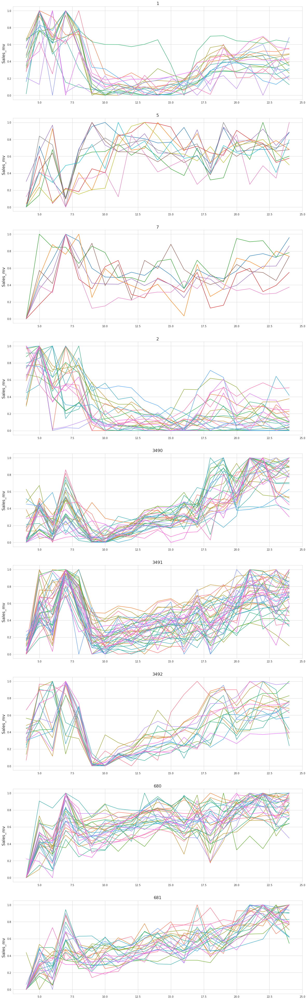

In [82]:
fig, ax = plt.subplots(9, 1, figsize=(20, 70))
for num, i in enumerate([   1,    5,    7,    2, 3490, 3491, 3492,  680,  681]):
  cluster_kind = list(cluster_ma[cluster_ma['그룹']==i]['업종'])
  temp = card[card['업종'].isin(cluster_kind)]
  sns.lineplot(x= temp['주'], y=temp['판매건수_sc'], hue=temp['업종'], ax=ax[num])
  ax[num].legend().set_visible(False); ax[num].set_xlabel("")
  ax[num].set_title(i, fontsize=16)
  ax[num].set_ylabel('Sales_mv', fontsize=16)

Text(0.5, 0, 'week')

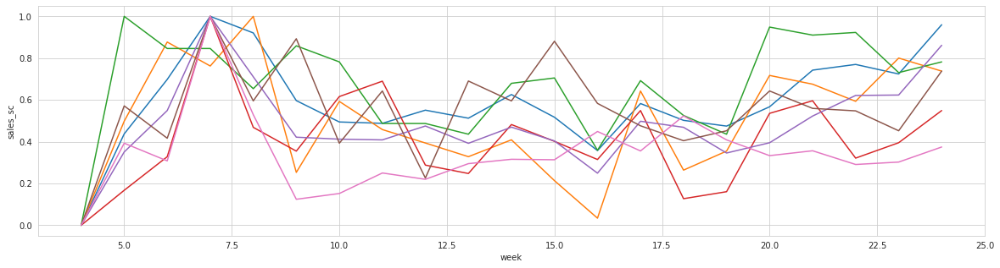

In [67]:
fig, ax = plt.subplots(figsize=(20, 5))
cluster_kind = list(cluster_ma[cluster_ma['그룹']==7]['업종'])
temp = card[card['업종'].isin(cluster_kind)]
sns.lineplot(x= temp['주'], y=temp['판매건수_sc'], hue=temp['업종'], legend=False, ax=ax)
ax.set_ylabel("sales_sc")
ax.set_xlabel('week')



In [77]:
shape = {3492:'increasing_1', 681:'increasing_2', 5:'increasing_3', 680:'increasing_4',3490:'curvy_1',3491:'curvy_2',1:'curvy_3',2:'decreasing_1'}
cluster_ma['형태'] = cluster_ma['그룹'].replace(shape)
cluster_ma = cluster_ma.copy()
category = shape.values()

#최종 클러스터 결과
@interact
def show(col=category):
    fig = go.Figure()
    cluster_kind = list(cluster_ma[cluster_ma['형태']==col]['업종'])
    temp_final = card_new[card_new['업종'].isin(cluster_kind)]
    fig=px.line(temp_final, x='주', y='이동평균_건수_sc', color='업종', hover_data=['업종'])
    fig.update_layout(title = 'business cluster', template='plotly_white',height=450, xaxis_title='week',
                      yaxis_title='sales_ma')
    fig.show()

interactive(children=(Dropdown(description='col', options=('increasing_1', 'increasing_2', 'increasing_3', 'in…

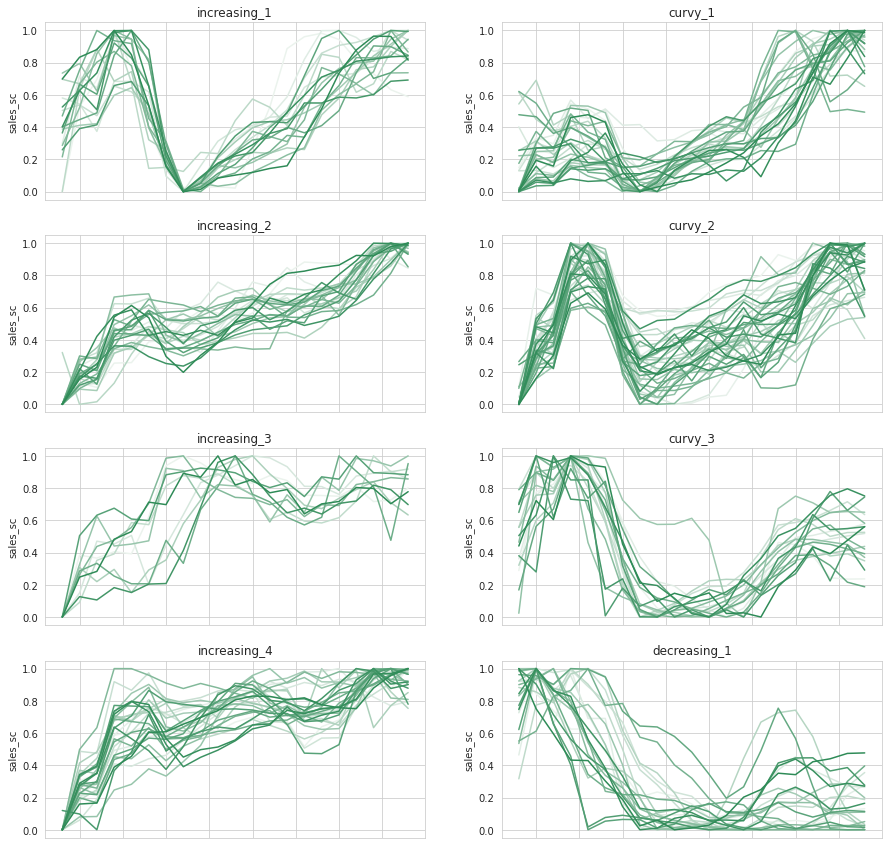

In [79]:
fig, ax =plt.subplots(4,2,figsize=(15,15))

for num, i in enumerate(category):
    if num<4: j=0
    else: 
        j=1; num=num-4
    cluster_kind = list(cluster_ma[cluster_ma['형태']==i]['업종'])
    temp_final = card_new[card_new['업종'].isin(cluster_kind)].copy()
    sns.lineplot(x="주", y="이동평균_건수_sc", hue="업종", data=temp_final, ax=ax[num,j], 
                 palette=sns.light_palette('seagreen', temp_final['업종'].nunique()))
    ax[num,j].legend().set_visible(False)
    ax[num,j].set_xticklabels([]); ax[num,j].set_xlabel('')
    ax[num,j].set_title(i)
    ax[num,j].set_ylabel("sales_sc")


In [83]:
cluster_ma[cluster_ma['그룹'] == 2]

,업종,그룹,형태
6,관광여행,2,decreasing_1
7,교육테이프,2,decreasing_1
9,기념품 점,2,decreasing_1
12,기타교통수단,2,decreasing_1
14,기타레져업,2,decreasing_1
17,기타의료기관및기타의료기기,2,decreasing_1
19,노래방,2,decreasing_1
23,면 세 점,2,decreasing_1
27,사우나,2,decreasing_1
28,수 영 장,2,decreasing_1
